In [1]:
# %load autotrading.py
import math
import time
import logging
import uuid
import pandas as pd
import matplotlib.pyplot as plt
from binance.enums import *
from binance.client import Client
from binance.enums import KLINE_INTERVAL_1HOUR
from binance.websockets import BinanceSocketManager
from keras import Model
from pymongo import MongoClient
from tqdm import tqdm
import numpy as np

from random import random, randrange
from keras.utils import to_categorical
from keras.layers import Input, Dense, Flatten, LSTM

logging.basicConfig(filename='../log/autotrade.log', filemode='w', format='%(name)s - %(levelname)s - %(message)s')
%matplotlib inline

Using TensorFlow backend.


In [2]:
class AutoTrading(object):
    def __init__(self):
        self.actions, self.states, self.rewards = [], [], []
        self.api_key = "y9JKPpQ3B2zwIRD9GwlcoCXwvA3mwBLiNTriw6sCot13IuRvYKigigXYWCzCRiul"
        self.api_secret = "uUdxQdnVR48w5ypYxfsi7xK6e6W2v3GL8YrAZp5YeY1GicGbh3N5NI71Pss0crfJ"
        self.binace_client = Client(self.api_key, self.api_secret)
        self.bm = BinanceSocketManager(self.binace_client)
        # mongodb
        self.client = MongoClient()
        self.db = self.client.crypto
        self.order = 0
        self.budget = 0
        self.order_type = 'sell'
        self.trading_data = []
        self.indexes = []
        self.norm_data = []
        self.windows = 20
        self.threshold = 0.05
        self.vec_threshold = 0.15
        self.trade_threshold = 90
        self.queue_size = 1000
        self.order_history = []
        self.tqdm_e = None
        self.prev_d = 0
        self.waiting_for_order = True
        self.stop_loss = 0
        self.waiting_time = 0

        # Environment
        self.time = 0
        self.cumul_reward = 0
        self.done = False
        self.old_state = np.array([0, 0])

        # plot point data
        self.exp4 = []
        self.exp5 = []
        self.exp6 = []
        self.exp7 = []

    def buildNetwork(self):
        """ Assemble shared layers
        """
        inp = Input((self.env_dim))
        # x = Flatten()(inp)
        x = Dense(32, activation='relu')(inp)
        x = Dense(32, activation='relu')(x)
        x = Dense(32, activation='relu')(x)
        return Model(inp, x)

    def reset(self):
        self.time = 0
        self.cumul_reward = 0
        self.done = False
        self.budget = 1000

    def process_message(self, msg):
        current_time = time.time()
        msg['k']['timestamp'] = current_time
        # print(msg)
        # insert = self.db.btc_data.insert_one(msg['k']).inserted_id

        if len(self.trading_data) > self.queue_size:
            self.trading_data.pop(0)
        if len(self.norm_data) > self.queue_size:
            self.norm_data.pop(0)

        self.trading_data.append(float(msg['k']['c']))
        # self.indexes.append(float(msg['k']['indexes']))

        # calculate norm data used for plot
        min_x = min(self.trading_data)
        max_x = max(self.trading_data)
        normalized = 0
        if max_x - min_x != 0:
            normalized = 20 * (float(msg['k']['c']) - min_x) / (max_x - min_x)
        self.norm_data.append(normalized)

        if len(self.trading_data) > self.windows:
            self.calculate_macd()

    def norm_list(self, list_needed):
        """Scale feature to 0-20"""
        min_x = min(list_needed)
        max_x = max(list_needed)
        if not min_x or not max_x:
            return list_needed

        return_data = list(map(lambda x: 20 * (x - min_x) / (max_x - min_x), list_needed))
        return return_data

    @staticmethod
    def angle_of_vectors(x, x0, y, y0):
        """
        Calculate angel of the two vector a = (x, y) b = (x0, y0)
        :param x:
        :param x0:
        :param y:
        :param y0:
        :return: angel
        """
        dotProduct = x - x0
        # for three dimensional simply add dotProduct = a*c + b*d  + e*f
        modOfVector1 = math.sqrt(pow(x - x0, 2) + pow(y - y0, 2))
        # for three dimensional simply add modOfVector = math.sqrt( a*a + b*b + e*e)*math.sqrt(c*c + d*d +f*f)
        angle = min(dotProduct / modOfVector1, 1)
        # print("Cosθ =", angle)
        angleInDegree = math.degrees(math.acos(angle))
        # print("θ =", angleInDegree, "°")
        return angleInDegree

    def calculate_macd(self):
        """
        Simulation trading and RL learning
        :return:
        """
        index = [i for i, val in enumerate(self.trading_data)]
        df = pd.DataFrame({'index': index, 'close': self.trading_data})
        df = df[['close']]
        df.reset_index(level=0, inplace=True)
        df.columns = ['ds', 'y']
#         plt.plot(df.ds, self.norm_data, label='Price')
#         plt.show()

        exp1 = df.y.ewm(span=12, adjust=False).mean()
        exp2 = df.y.ewm(span=26, adjust=False).mean()
        macd = exp1 - exp2
        exp3 = macd.ewm(span=9, adjust=False).mean()

        # calculate break point
        if len(self.exp4) > 1:
            self.exp4.pop(0)
        if len(self.exp5) > 1:
            self.exp5.pop(0)
        if len(self.exp6) > 1:
            self.exp6.pop(0)
        if len(self.exp7) > 1:
            self.exp7.pop(0)

        if len(self.trading_data) == self.queue_size + 1:
            self.exp4 = [x - 1 for x in self.exp4]
            self.exp6 = [x - 1 for x in self.exp6]

        exp3_cp = self.norm_list(list(exp3.copy()))
        start_point = len(exp3_cp) - self.windows - 1
        end_point = len(exp3_cp) - 1
        block = exp3_cp[start_point:]
        chunk_idx = len(exp3_cp) - self.windows // 2 - 1
        angel_degree_1 = self.angle_of_vectors(x=chunk_idx, x0=start_point,
                                               y=exp3_cp[chunk_idx], y0=exp3_cp[start_point])
        angel_degree_2 = self.angle_of_vectors(x=end_point, x0=chunk_idx,
                                               y=exp3_cp[end_point], y0=exp3_cp[chunk_idx])

        if block[self.windows // 2] - block[0] < 0:
            # trend down
            angel_degree_1 = -angel_degree_1
        if block[-1] - block[self.windows // 2] < 0:
            # trend down
            angel_degree_2 = -angel_degree_2

        total_angel = angel_degree_1 + angel_degree_2
        if not self.check_profit(self.trading_data[-1]):
            if not self.check_lost(self.trading_data[-1]):
                if total_angel < 1:
                    if exp3_cp[chunk_idx] > 10:
                        # bắt đầu ngừng tăng hoặc giảm.
                        # sell
                        if not self.waiting_for_order:
                            diff = self.sell_order(self.trading_data[-1])
                            # r = 0.01
                            if diff > 0:
                                r = 0.01
                            self.exp6.append(len(exp3_cp))
                            self.exp7.append(self.norm_data[-1])
                            self.waiting_for_order = True

                    if exp3_cp[chunk_idx] < 5:
                        # tín hiệu bắt đầu tăng
                        if self.waiting_for_order:
                            self.buy_order(self.trading_data[-1])
                            self.exp4.append(len(exp3_cp))
                            self.exp5.append(self.norm_data[-1])
                            self.waiting_for_order = False
                            # r = -0.01
        
                self.waiting_time += 1

        plt.cla()
        plt.plot(df.ds, self.norm_data, label='Budget: {}, {}'.format(angel_degree_1, angel_degree_2))
        # plt.plot(df.ds, macd, label='AMD MACD', color='#EBD2BE')
        plt.plot(df.ds, exp3_cp, label='Signal Line {}'.format(self.budget), color='#E5A4CB')
        plt.legend(loc='upper left')
        plt.plot(self.exp4, self.exp5, 'ro', color='blue')
        plt.plot(self.exp6, self.exp7, 'ro', color='red')
        plt.pause(0.00001)
#         self.tqdm_e.set_description("Profit: " + str(self.budget))
#         self.tqdm_e.refresh()
        
    def check_lost(self, price):
        """Close order when loss $5"""
        if not self.waiting_for_order:
            if price <= self.stop_loss or self.waiting_time > 50:
                self.sell_order(price)
                self.waiting_for_order = True
                logging.warning("Stop loss: {} => {} profit {} budget: {}".format(self.order, price,
                                                                                  round(price-self.order, 2), self.budget))
                return True                                                                  
        return False
    
    def check_profit(self, price):
        """Close order when take $5 profit"""
#         if not self.waiting_for_order:
#             if self.order - price > 10:
#                 self.sell_order(price)
#                 self.waiting_for_order = True
#                 return True
        return False
    
    def buy_order(self, price):
        order_info = {
            'id': str(uuid.uuid4()),
            'price': price,
            'type': 'buy',
            'stop_loss': price
        }
        if len(list(filter(lambda d: d['price'] == price, self.order_history))) == 0:
            if self.order_type == 'sell':
                self.order_history.append(order_info)
                self.order = price
                self.stop_loss = price - 3
                self.order_type = 'buy'

    def sell_order(self, price):
        order_info = {
            'id': str(uuid.uuid4()),
            'price': price,
            'type': 'sell'
        }
        diff = 0
        if len(list(filter(lambda d: d['price'] == price, self.order_history))) == 0:
            self.order_history.append(order_info)
            if self.order_type == 'buy':
                diff = price - self.order
                self.budget = self.budget + round(diff, 2)
                if diff > 0:
                    logging.warning("Take Profit: {} => {} profit {} budget: {}".format(self.order, price,
                                                                                        round(diff, 2), self.budget))
                # clear status
                self.order_type = 'sell'
                self.waiting_time = 0
                
        return diff

    def test_order(self):
        """Create a new test order"""
        order = self.binace_client.create_test_order(
            symbol='BTCUSDT',
            side=SIDE_BUY,
            type=ORDER_TYPE_MARKET,
            quantity=100
        )

    def getStockDataVec(self, key):
        indexes = []
        lines = open("../data/" + key + ".csv", "r").read().splitlines()
        prices = []
        delimiter = ','
        first_index = float(lines[2].split(delimiter)[1])
        for _index, line in enumerate(lines[2:]):
            prices.append(float(line.split(delimiter)[0]))
            indexes.append(float(line.split(delimiter)[1]) - first_index)

        return indexes, prices

    def start_socket(self):
        # start any sockets here, i.e a trade socket
        conn_key = self.bm.start_kline_socket('BTCUSDT', self.process_message, interval=KLINE_INTERVAL_1HOUR)
        # then start the socket manager
        self.bm.start()

    def start_mockup(self, kind_of_run):
        indexes, price_data = trading_bot.getStockDataVec('train(1)')
        total_sample = len(price_data)
        start_idx = 250000
        end_idx = start_idx + 50000
#         print("Max profit: {}".format(price_data[start_idx] - price_data[end_idx]))
        self.tqdm_e = tqdm(price_data[start_idx: end_idx], desc='Steps', leave=True, unit=" episodes")
        for item in price_data[start_idx: end_idx]:
            msg = {
                'k': {
                    'c': item
                }
            }
            trading_bot.process_message(msg)

Steps:   0%|          | 0/50000 [00:00<?, ? episodes/s]

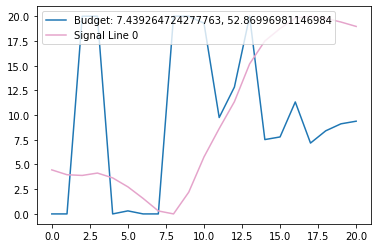

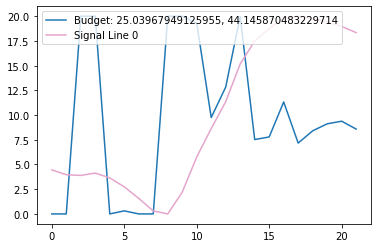

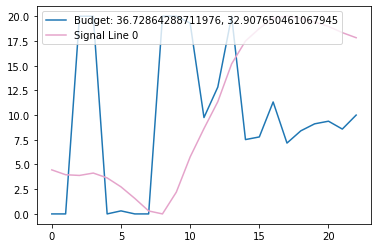

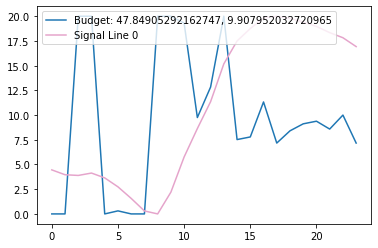

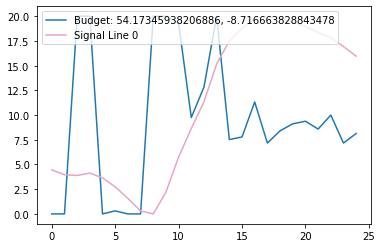

...

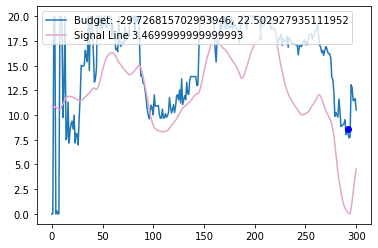

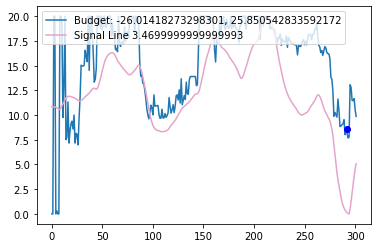

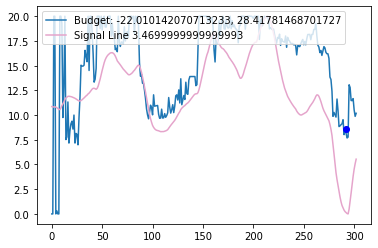

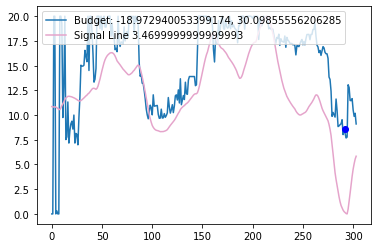

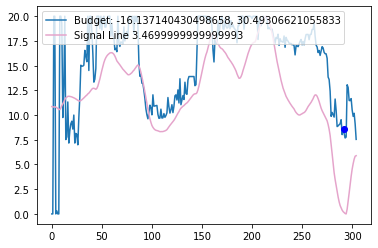

In [ ]:
if __name__ == '__main__':
    trading_bot = AutoTrading()
    trading_bot.start_mockup("train")
    # trading_bot.start_socket()